### This notebook aims to study the correlation between local MAE rate and local DAE rate.

In [1]:
import numpy as np
import yaml
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import os
os.chdir(os.path.dirname(os.getcwd()))
print("Current working directory: ", os.getcwd())
from utils.visualize import *

# Load configs: benchmarks, model variants, OoD datasets and save directory.
with open('config.yaml', 'r') as f:
    configs = yaml.safe_load(f)
    
score_functions = configs["score_functions"]
perturb_functions = configs["perturb_functions"]
rand_seed = configs["rand_seed"]

# Define the order of perturbation functions and model variants in visualizations.
perturb_function_sorter = configs["perturb_functions"]
variant_sorter = ["NT", "DA", "AT", "PAT"]

sns.set_style("whitegrid")

Current working directory:  /home/dingw/work/ood_robustness_eva


#### 1. Make the local MAE-DAE rate regression plot.
- For each model architecture, we study 4 model variants (NT, DA, AT, PAT) and 12 OoD detectors.
- We calculate and display R-squared with p-values.

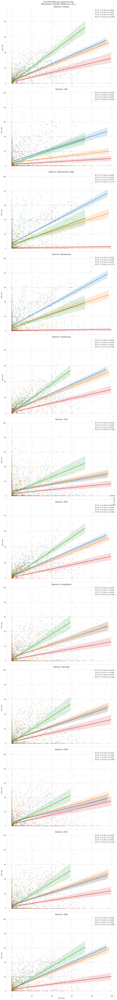

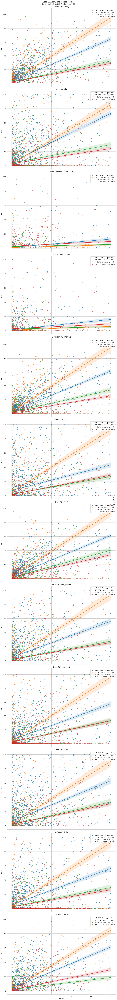

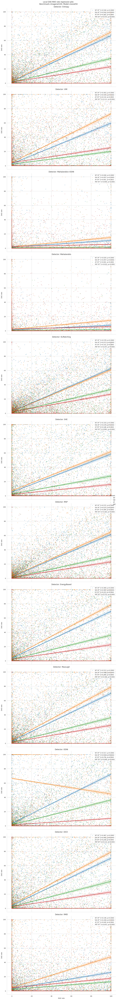

In [2]:
save_dir = os.path.join("results", "eval", "robustness", "figures", "local_mae_dae_correlation")
rlt_dir = os.path.join("results", "eval", "intermediate_results")
os.makedirs(save_dir, exist_ok=True)

for benchmark in configs["benchmark"]: 
    for model_name in configs["benchmark"][benchmark]["model"]:
        # Load the MAE/DAE rate table on ID dataset.
        df_id = pd.DataFrame()
        for variant in configs["benchmark"][benchmark]["model"][model_name]:
            file_path = os.path.join(rlt_dir, f"{benchmark.lower()}_{model_name}_{variant}", "id_local_mae_dae_rate.csv")

            
            if os.path.exists(file_path):
                df = pd.read_csv(file_path).copy()
                df["variant"] = variant
                df_id = pd.concat([df_id, df], axis=0).copy()

        # df_id["perturb_function"] = df_id["perturb_function"].astype("category")
        # df_id["perturb_function"] = df_id["perturb_function"].cat.set_categories(perturb_function_sorter, ordered=True)
        df_id["variant"] = df_id["variant"].astype("category")
        df_id["variant"] = df_id["variant"].cat.set_categories(variant_sorter, ordered=True)
        df_id = df_id.sort_values(by=["variant", "perturb_function"])
        cols = [col for col in df_id.columns if "dae" in col or "mae" in col]
        df_id[cols] = df_id[cols].apply(lambda x: x * 100)
        
        # Make the MAE-DAE regression plot.
        pg = sns.pairplot(df_id, x_vars=["mae"], hue="variant", kind="reg", markers=["o", "^", "s", "x"],
                     y_vars=[col for col in df_id.columns if "dae" in col],
                     height=8, aspect=1.3, plot_kws=dict(scatter_kws=dict(alpha=0.7, s=3)))
        fig = pg.figure
        fig.set_layout_engine('constrained')
        fig.suptitle(f"Local DAE-MAE rate regression plot.\nBenchmark={benchmark}, Model={model_name}")

        # Calculate and display the R values
        for ax in fig.axes:
            score_func = ax.get_ylabel().split("_")[-1]
            rsquared_dict = dict()
            p_dict = dict()
            for variant in configs["benchmark"][benchmark]["model"][model_name]:
                df = df_id[df_id["variant"] == variant].copy()
                df = df[["mae", f"dae_{score_func}"]].copy()
                df = df.dropna(how="any", axis=0)
                if df.shape[0] == 0:
                    continue
            
                y = df[f"dae_{score_func}"]
                x = df[["mae"]]
                x = sm.add_constant(x)
                lr_model = sm.OLS(y, x).fit()
                r_squared = lr_model.rsquared
                p = lr_model.pvalues["mae"]
                rsquared_dict[variant] = r_squared
                p_dict[variant] = p

            ax.set_title(f"Detector: {score_func}")
            ax.set_xlabel("MAE rate")
            ax.set_ylabel("DAE rate")
            handles, labels = ax.get_legend_handles_labels()
            labels = []
            for variant in variant_sorter:
                if variant in rsquared_dict:
                    labels.append(f"{variant} (R^2={rsquared_dict[variant]:.3f}, p={p_dict[variant]:.3f})")
                else:
                    labels.append(f"{variant}")
            ax.legend(handles=handles, labels=labels, loc="upper right")
        
        plt.savefig(os.path.join(save_dir, f"{benchmark}_{model_name}_dae_mae_regression.png"))
        plt.show()
        plt.close()


#### 2. Local MAE/DAE rate - LRP robustness regression plot. (not implemented)
- LRP robustness indicators: MSE, SSIM, PCC, NCC